<a href="https://colab.research.google.com/github/thedenaas/jub_ml/blob/main/fall_2022/seminar_5/seminar5_task.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas
import random
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
import matplotlib
import copy

## utils

In [ ]:
def get_colors(distances, alpha=True):
    normed = np.array(distances) - np.min(distances)
    normed = normed / np.max(normed)
    alpha = 1/np.mean([len(row) for row in normed])**0.5 if alpha else 1.
    return [[((1. if n > 0.5 else 2 * n), (1. if n < 0.5 else 2 - 2*n), 0., alpha) 
             for n in row] for row in normed]

def get_coords(points):
    results = []
    for pts in points:
        x_prev, _ = pts[0]
        result = [pts[0]]
        for x, y in list(pts[1:]) + [pts[0]]:
            result.append((x_prev, y))
            result.append((x, y))
            x_prev = x
        results.append(list(zip(*result)))
    return results

def init_figure(X):
    upper_bound, lower_bound = X.max(axis=0) + 1, X.min(axis=0) - 1
    fig, ax = plt.subplots(figsize=(10, 10), nrows=1, ncols=1)
    #ax.set_facecolor((0.1, 0.1, 0.1))
    ax.grid(True)
    #ax.grid(True, color=(0.9, 0.9, 0.9))
    ax.set_xticks(range(lower_bound[0], upper_bound[0]))
    ax.set_yticks(range(lower_bound[1], upper_bound[1]))
    ax.set_xlim(lower_bound[0], upper_bound[0])
    ax.set_ylim(lower_bound[1], upper_bound[1])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.scatter(X[:, 0], X[:, 1], color=(0, 0, 1))
    plt.tight_layout()
    return fig, ax    

def visualize_hillclimb(X, hillclimb):
    fig, ax = init_figure(X)
    permutations = hillclimb.optimize_explain(X)
    colors = get_colors([[cyclic_distance(X[p], hillclimb.dist) for p in permutations]], False)[0]
    coords = get_coords([X[p] for p in permutations])
    plot = ax.plot(coords[0][0], coords[0][1], color=colors[0])[0]
    
    def animate(i):
        plot.set_color(colors[i])
        plot.set_data(*coords[i])
        return (plot,)
    
    return animation.FuncAnimation(fig, animate, frames=len(permutations), interval=100, blit=True)

def visualize_genetic(X, genetic):
    fig, ax = init_figure(X)
    populations = genetic.optimize_explain(X)
    distances = [[cyclic_distance(X[p], genetic.dist) for p in populations[i]] for i in range(len(populations))]
    colors = get_colors(distances)
    coords = get_coords([X[p] for p in populations[0]])
    plots = [ax.plot(x, y, color=c)[0] for (x, y), c in zip(coords, colors[0])]
    best_id = np.argmin(distances[0])
    best_plot = ax.plot(*coords[best_id], color=(0.3, 0.3, 1, 0.9), linestyle="-.")[0]
    
    def animate(i):
        coords = get_coords([X[p] for p in populations[i]])
        for p, (x, y), c in zip(plots, coords, colors[i]):
            p.set_color(c)
            p.set_data(x, y)
        best_id = np.argmin(distances[i])
        best_plot.set_data(*coords[best_id])
        return plots + [best_plot]
    
    return animation.FuncAnimation(fig, animate, frames=len(populations), interval=100, blit=True)

In [ ]:
def synthetic_points(count=25, dims=2):
    return np.random.randint(40, size=(count, dims))

X = synthetic_points()

## Problem

We will be working with a variant of the TSP problem. Here the salesman need to visit each point and return to the starting one. All points are on $\mathbb{R}^2$ plane. 

## Task 1

`cyclic_distance(points, dist)` - returns total traveled distance in cycle of `points` calculated with `dist`.


`l1_distance(p1, p2)` - return Manhattan distance between two points

In [ ]:
def cyclic_distance(points, dist):
    # todo

def l1_distance(p1, p2):
    # todo

## Task 2. Hill climb
Here you need to find a solution using hill climb. 

#### Methods
`optimize_explain(X)` - returns list of all permutation obtained during the optimization. `X` is a array of 2d points that we need to visit. During the search consider permuations to be near if they are within one permutaion. The optimization process must make no more than `max_iterations` iterations.


In [12]:
class HillClimb:
    def __init__(self, max_iterations):
        self.max_iterations = max_iterations
        self.dist = l1_distance
    
    def optimize(self, X):
        return self.optimize_explain(X)[-1]
    
    def optimize_explain(self, X):
       # todo

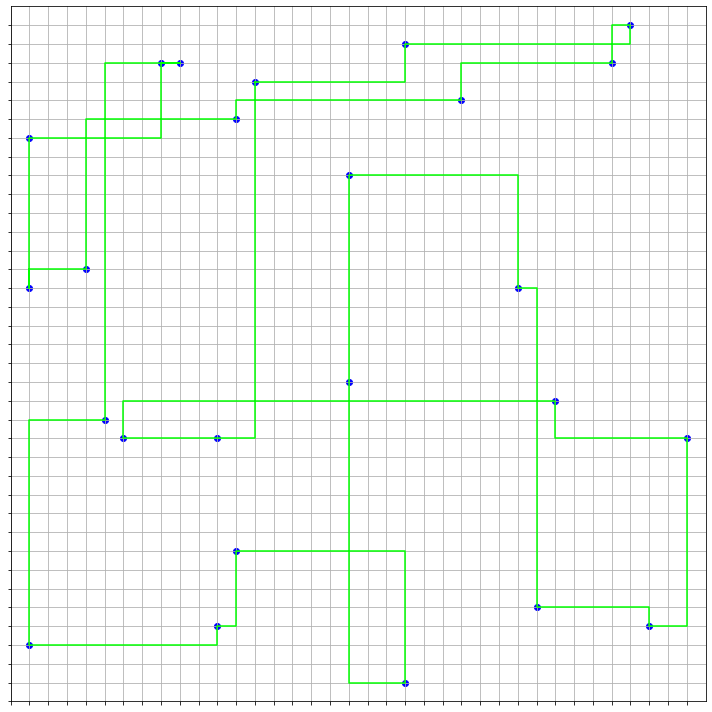

In [14]:
hc = HillClimb(100)
HTML(visualize_hillclimb(X, hc).to_jshtml())

In [ ]:
cyclic_distance(X[hc.optimize(X)], l1_distance)

302

## Task 3. Genetic algorithm
Here you need to find a solution using genetic algorithm. 


#### Methods
`optimize(X)` - returns best permutation among last population `optimize_explain(X)`

`optimize_explain(X)` - return list with size = `iterations` of populations with size = `population_size` with permutations of points on `X`. Use following genetic algorithm scheme:

1. initial population is random permutations
2. cyclic_distance is a fitness function
3. on each iterations best `survivors_count` permutaions survive and move to the next population. Rest of the new population are obtained from the survivers
4. For each new permutation. Choose two parents at random and 'breed' them
5. You can use following generation: select random point, go to it in one parent, then make a cycle in second parent, then finish cycle in first parent, after that remove all repeated points.
6. Mutate each new child with probability `mutation_prob`. Mutation is one random transposition

In [ ]:
class Genetic:
    def __init__(self, iterations, population_size, survivors_count, mutation_prob):
        self.pop_size = population_size # size of a population
        self.surv_count = survivors_count # number of surviving members
        self.iters = iterations # number of iterations of genetic algorithm
        self.mutation_prob = mutation_prob # mutation probaility

        self.dist = l1_distance
    
    def optimize(self, X):
        # todo

        
    def optimize_explain(self, X):
        # todo
        

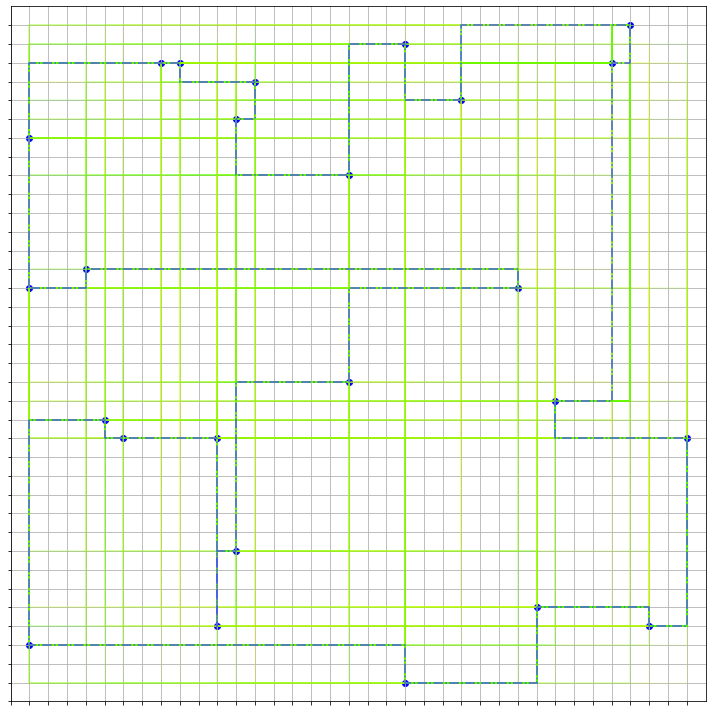

In [ ]:
gen = Genetic(200, 100, 20, 0.1)
HTML(visualize_genetic(X, gen).to_jshtml())

In [ ]:
cyclic_distance(X[gen.optimize(X)], l1_distance)